In [1]:
import pandas as pd
import numpy as np
from textblob import TextBlob
from textblob.sentiments import NaiveBayesAnalyzer
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from nltk.corpus import stopwords
import nltk
import collections
import seaborn as sb

import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\kathe\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [3]:
# load English stop words
en_stop = stopwords.words('english')

In [19]:
# Create stopword list:
stopwords = set(STOPWORDS)
stopwords.update(["applause", "mr", "-", "'s"])

In [73]:
# read scrapped speeches saved in csv foramt

df = pd.read_csv('JFK_speech_nlp.csv')

In [9]:
# extract year, month of every speech and add new empty column

df['speech_year'] = pd.to_datetime(df['speech_date']).dt.year
df['speech_month'] = pd.to_datetime(df['speech_date']).dt.month
df['cleanedup_words'] = ''

In [13]:
# speech 737 is missing from df, hencing adding it manually

df.at[737, 'speech'] = "Ladies and gentlemen: First of all, I want to express my regrets if there are any Republican commuters who have been caught unwillingly in this crowd. (Laughter) I am delighted to be here. John Murphy, who I hope will be the Congressman from this District – (Applause) – Ralph Diorio, who is running for the State Senate, with Elaine Kovessey, who is running for the Assembly, and Phillip Massa, who is running for the Assembly, and Judge Ughetta, running for the Court of Appeals, (Applause), and I am running for the Presidency. (Applause). Ladies and gentlemen, I will be very brief. Let me just say that I run for the Presidency in a difficult time in the life of our country, and the issue which separates Mr. Nixon and myself is what our view is of the country, what our view is of the potential of the country, and what our responsibility is as a country towards all those countries who look to us for example, for hope, for strength. And it is on these great issues which go to the heart of the matter of our time that Mr. Nixon and I, the Republican Party and the Democratic Party, separate. Mr. Nixon runs on programs that we have never had it so good, that our prestige has never been higher – (response from the audience). I don’t know what the people of this country will decide on November 8, but you cannot possibly say that Mr. Nixon and I agree on the great questions of our time. We disagree on the objectives of our society and we disagree on the means by which these objectives can be attained. You have to decide yourselves as citizens of this state of New York, as citizens of this community, as citizens of our country, as believers in freedom – you have to decide a week from Tuesday what you think of us, what you believe our responsibility, whether you feel satisfied with our progress, whether you feel the tide of history is moving with us or against us. All of you individually have to make your judgment. Mr. Nixon has made his judgment of our time, and I have made our judgment, and we disagree. You have to decide. You are the judge in this case. (Applause) My guess is that you will decide on what you believe best for the country, and my judgment is, so that you will understand my view, I believe that what is best for this country is that we have in Washington a President in the administration, in the Congress, in the House and Senate, that we have people who believe that this country is not doing enough today to meet its obligation, who are not satisfied with our present program, who are willing to break new ground, who will bring people to Washington, men and women, with intellectual curiosity, a sense of the future, a knowledge of the great struggles which face us in every area of the world. My feeling is that this administration has been manned by people who have been uninterested in the sweep of history and the revolutionary times in which they live, and now as a result we are second best in space – (Response from the audience) – we are graduating one half as many scientists and engineers as the Soviet Union. Our economic strength, our economic growth increases about a third as much as theirs every year. In the last eight months our economic growth did not grow at all; it went back. We can’t afford that. We have to find 25,000 new jobs a week every week for the next ten years if we are going to keep our people working. We can’t afford to be second best in any area of activity, because when we are, we not only short change ourselves, but we let down all those who wish to be free, Eastern Europe, Africa, Asia, Latin America, who recognize in us the only sentinel at the gate of freedom, the only hope of freedom, the only strong, free society that can give leadership to the cause of freedom. Mr. Khrushchev’s strength comes from the productive power of the Soviet Union. Our strength comes from the kind of society we build here. It is a clash between those who believe in freedom and those who wish to dominate by the state all the lives around the world. In these dangerous times, we cannot afford to be second best. We cannot possibly afford to let freedom down. I want Mr. Khrushchev to know that a new generation of Americans has taken over in this country, who are committed to the expansion of freedom all around the world. (Applause) That is our objective, that is our objective. And what is the objective of Mr. Nixon? He has stated it. He believes that our prestige in the world has never been higher. He is satisfied. I am dissatisfied. (Response from the audience) This country was made by people who have been dissatisfied, who wanted to move on, and we want to move on in the Sixties. We want to build the kind of society here which will serve as an example to people of what freedom can do. We want to show the Communists that their system is as old as Egypt, that their system is doomed, that we represent the way of the future, and the only way to do that is to pick ourselves up and go back to work again, to move our country forward, to do the things that need to be done. (Applause). Let me say finally you must make your judgment of which philosophy serves freedom better, a philosophy of a government which has permitted three recessions, 1954, 1958 and now a danger of one now, using 50 per cent of our steel capacity, 35 per cent of our brightest boys and girls getting out of school not going to college? I believe we can do better. I believe we must do better. And if you hold that view, I ask your support in building this country and moving it ahead. (Applause). Let me say in conclusion that in Hartford, Connecticut, in New England, in 1789, the skies at noon turned one day a blue gray; by mid-afternoon the city had darkened over so densely that in that religious age men fell on their knees and begged a final blessing before the end came. The Connecticut House of Representatives was in session, and many of the members clamored for immediate adjournment. The Speaker of the House, one Colonel Davenport, came to his feet and silenced the din with these words: “The day of Judgment is either approaching or it is not. If it is not, there is no cause for adjournment. If it is, I choose to be found doing my duty. I wish, therefore, that candles may be brought.”. I hope that all of us in a great time in the life of our country, devoted as we are to our country’s interest, may bring candles to help illuminate our country’s way. Thank you. (Applause)"

In [18]:
# get sentiment for every speech, by using NaiveBayesAnalyzer, obtain count/percentage of positive to negative sentences

for i in range(df.shape[0]):
    blob = TextBlob(df['speech'][i], analyzer=NaiveBayesAnalyzer())
    blob_sentences = blob.sentences

    blob_sentiment = []
    for sentence in blob_sentences:
        blob_sentiment.append(sentence.sentiment.classification)
    
    df.at[i,'positive_count'] = blob_sentiment.count('pos')
    df.at[i,'positive_pct'] = blob_sentiment.count('pos')/len(blob_sentiment)
    df.at[i,'negative_count'] = blob_sentiment.count('neg')
    df.at[i,'negative_pct'] = blob_sentiment.count('neg')/len(blob_sentiment)

In [84]:
# create a list of cleaned word for every speech (remove stop words and lemmatize)

for i in range(df.shape[0]):
    blob = TextBlob(df['speech'][i])

    # remove stop words
    blob_nonstop = [word for word in blob.words.lower() if word not in stopwords]

    # lemmatize non-stop words
    blob_nonstop_lemma = []
    for word in blob_nonstop:
        blob_nonstop_lemma.append(word.lemmatize())

    df.at[i,'cleanedup_words'] = blob_nonstop_lemma

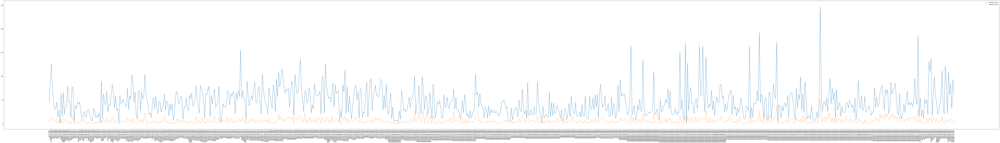

In [53]:
# plot count of positive & negative sentences per speech

plt.figure(figsize=(150, 20))
g = sb.lineplot(data=df[['positive_count', 'negative_count']]);

g.set_xticks(range(len(df['speech_date']))) # <--- set the ticks first
g.set_xticklabels(df['speech_date'])

plt.xticks(rotation=90);
plt.show();

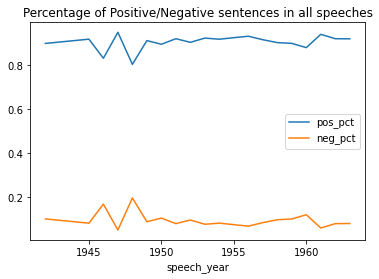

In [29]:
# plot percentage of positive & negative sentences in all speech grouped by year

g1 = df.groupby('speech_year')['positive_pct'].mean().rename('pos_pct')
g2 = df.groupby('speech_year')['negative_pct'].mean().rename('neg_pct')

g = pd.merge(g1, g2, on='speech_year')
g[['pos_pct', 'neg_pct']].plot();
plt.title("Percentage of +ve/-ve sentences in speeches per year");


In [86]:
# check word count in speech #3 and get top 25

for i in range(df.shape[0]):
    counter = collections.Counter(df['cleanedup_words'][i])
    
    df.at[i, 'secret_count'] = counter['secret']
    df.at[i, 'freedom_count'] = counter['freedom']
    df.at[i, 'society_count'] = counter['society']
    df.at[i, 'speech_count'] = counter['speech']
    df.at[i, 'china_count'] = counter['china']
    df.at[i, 'russia_count'] = counter['russia']
    df.at[i, 'isreal_count'] = counter['isreal']
    df.at[i, 'threat_count'] = counter['threat']
    df.at[i, 'war_count'] = counter['war']
    df.at[i, 'censor_count'] = counter['censor']
    df.at[i, 'conspiracy_count'] = counter['conspiracy']
    df.at[i, 'invasion_count'] = counter['invasion']
    df.at[i, 'fear_count'] = counter['fear']
    df.at[i, 'news_count'] = counter['news']

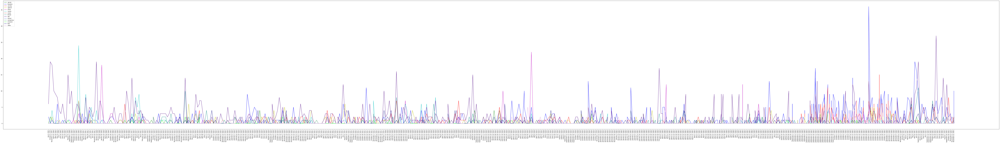

In [90]:
# plot count of positive & negative sentences per speech

plt.figure(figsize=(150, 20))

plt.plot(df['speech_date'], df['secret_count'], c="g", label="secret")
plt.plot(df['speech_date'], df['freedom_count'], c="b", label="freedom")
plt.plot(df['speech_date'], df['society_count'], c="r", label="society")
plt.plot(df['speech_date'], df['speech_count'], c="y", label="speech")
plt.plot(df['speech_date'], df['china_count'], c="m", label="china")
plt.plot(df['speech_date'], df['russia_count'], c="c", label="russia")


plt.plot(df['speech_date'], df['isreal_count'], c="firebrick", label="isreal")
plt.plot(df['speech_date'], df['threat_count'], c="teal", label="threat")
plt.plot(df['speech_date'], df['war_count'], c="indigo", label="war")
plt.plot(df['speech_date'], df['censor_count'], c="royalblue", label="censor")
plt.plot(df['speech_date'], df['conspiracy_count'], c="seagreen", label="conspiracy")
plt.plot(df['speech_date'], df['invasion_count'], c="lime", label="invasion")

plt.plot(df['speech_date'], df['fear_count'], c="navy", label="fear")
plt.plot(df['speech_date'], df['news_count'], c="plum", label="news")

plt.legend(loc="upper left")

plt.xticks(rotation=90);
plt.show();

In [24]:
# save new data to csv
#df.to_csv('JFK_speech_nlp.csv', index=False)

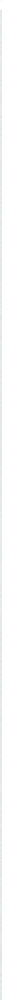

In [55]:
# plot wordcloud of every speech
fig, ax = plt.subplots(nrows=df.shape[0], figsize = [50,900])
fig.suptitle("Most words per Speech")

for i in range(df.shape[0]):
    
    # Generate a word cloud image
    wordcloud = WordCloud(stopwords=stopwords, background_color="white", width=800, height=400).generate(df['speech'][i])
    ax[i].imshow(wordcloud, interpolation='bilinear')
    ax[i].set_title(df.speech_date[i])
    ax[i].axis("off")

plt.tight_layout()
fig.subplots_adjust(top=0.97)
plt.show()